In [1]:
%matplotlib inline
import sys, os, glob

from astropy.io import fits, ascii

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from astropy import units as u
from astropy.table import Table
import astropy.constants as const
from astropy.coordinates import SkyCoord, concatenate
from astropy import table

from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

import scipy.stats as st
from scipy.optimize import minimize

import emcee
import corner

from scipy.special import erf, gamma, gammainc
from scipy.signal import fftconvolve
from scipy.interpolate import interp1d
from scipy.integrate import trapezoid, cumulative_trapezoid



In [2]:
import scienceplots

plt.style.use(['science', 'no-latex', 'notebook', 'light'])

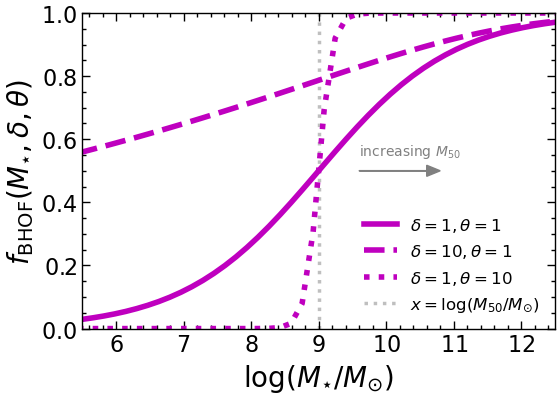

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(5.8, 4.2))

x_eval = np.linspace(5, 13)

delta = 1
theta2 = 1
x50 = 9
focc = 1/(1 + delta * np.exp(-theta2*(x_eval - x50)))**(1/delta)
ax.plot(x_eval, focc, label=r'$\delta=1, \theta=1$', lw=4, color='m')

delta = 10
theta2 = 1
focc = 1/(1 + delta * np.exp(-theta2*(x_eval - x50)))**(1/delta)
ax.plot(x_eval, focc, label=r'$\delta=10, \theta=1$', lw=4, color='m', linestyle='dashed')

delta = 1
theta2 = 10
focc = 1/(1 + delta * np.exp(-theta2*(x_eval - x50)))**(1/delta)
ax.plot(x_eval, focc, label=r'$\delta=1, \theta=10$', lw=4, color='m', linestyle='dotted')

ax.axvline(x50, label=r'$x=\log(M_{50}/M_{\odot})$', color='gray', lw=2.5, zorder=-1, linestyle='dotted', alpha=0.5)

ax.set_xlim(5.5, 12.5)
ax.set_ylim(0, 1)

ax.legend(fontsize=12, loc='lower right')
ax.set_xlabel(r'$\log(M_{\star}/M_{\odot})$', fontsize=20)
ax.set_ylabel(r'$f_{\rm{BHOF}}(M_{\star}, \delta, \theta)$', fontsize=20)

ax.arrow(9.6, 0.5, 1, 0, lw=1, head_width=.035, head_length=.2, color='gray')
ax.text(9.6, 0.55, 'increasing $M_{50}$', color='gray')

fig.tight_layout()
fig.savefig('bohf.pdf', dpi=300)

In [4]:
def f_bhof_B19(x, x0, f_a=1, p_seed=0.8, logMc=10):

    # Buchner analytic model     
    Mc = 10**logMc
    Ms = 10**x # stellar mass of 10^8.5

    # SHMR
    A = 0.0465
    M_A = 10**11.77
    beta = 1.00
    Mh = 2**(-1/(beta + 1)) * (M_A**beta * Ms / A)**(1/(beta + 1)) # halo mass

    N = 1/2 * (Mh/Mc)**(3/4)
    f_occ = 1 - (1 - p_seed)**N

    return f_a * f_occ

In [5]:
def f_x(x, x0, f_a=1, delta=1, theta2=2.5):

    # Occupation function (Miller 2015)
    focc = 1/(1 + delta * np.exp(-theta2*(x - x0)))**(1/delta)

    return f_a * focc

def f_r(x, x0, f_a=1, delta=1, theta2=2.5):

    # Occupation function (Miller 2015)
    focc = 1/(1 + delta * np.exp(-theta2*(x - x0)))**(1/delta)
    
    return f_a * focc

def f_o(x, x0, f_a=1, delta=1, theta2=2.5):

    # Occupation function
    focc =  1/(1 + delta * np.exp(-theta2*(x - x0)))**(1/delta)

    return f_a * focc

In [6]:
def log_likelihood_x(theta, x, y, xerr, yerr, logSFR, logSFRerr, d25, n, p_obs, r_match):
    
    # parameters to be fit
    log_ms0, delta, theta2, delta1, ep, log_lam_min, log_lam_s, log_f, f_a, P_XRB = theta
    
    mask_det = yerr > 0

    x_bh = 6.70 + 1.61*(x - np.log10(3e10)) # Late-type (AGN)

    L_HX = 9.05*1e28 * 10**x + 1.62*1e39 * 10**logSFR
    L_gas = 8.3*1e38 * 10**logSFR
    b = 2*n - 1/3
    alpha = ((2*r_match)/d25)
    logL_SF = np.log10(L_HX + L_gas) + np.log10(gammainc(2*n, b*alpha**(1/n)) / gammainc(2*n, b))
    
    BC = 1 # Bolometric correction
    log_lam = y + BC - 38.2 - x_bh # resid
    lam = 10**log_lam
    lam_s = 10**log_lam_s

    if log_lam_min > np.min(log_lam[mask_det]):
        return -np.inf
    
    log_lam_max = np.max(log_lam[mask_det])

    dlog_lam = 0.1
    dlog_lam_int = 0.1
    log_lam_eval = np.arange(log_lam_min, log_lam_max + dlog_lam, dlog_lam)
    log_lam_int = np.arange(-6, log_lam_max + 2 + dlog_lam, dlog_lam_int) #
    lam_eval = 10**log_lam_eval
    lam_int = 10**log_lam_int
    dlam_eval = np.diff(lam_eval)
    dlam_int = np.diff(lam_int)
    
    s2 = np.full(len(mask_det), np.exp(2*log_f)**2 + (1.61*xerr)**2)
    s2[mask_det] = yerr[mask_det]**2 + np.exp(2*log_f)**2 + (1.61*xerr[mask_det])**2

    # Either the source is an XRB or a BH
    # Try making the scatter here a free parameter
    s2_XRB = np.full(len(mask_det), (0.4)**2 + xerr**2)
    s2_XRB[mask_det] = (0.4)**2 + (yerr[mask_det])**2 + (xerr[mask_det])**2 + (logSFRerr[mask_det])**2
    pdf_XRB = st.norm.pdf(y[mask_det] - logL_SF[mask_det], scale=np.sqrt(s2_XRB[mask_det]))

    # p = f * N + (1 - p) delta 
    _f_BHOF = f_x(x, log_ms0, f_a, delta, theta2)
    #_f_BHOF = f_bhof_B19(x, log_ms0, f_a, p_seed=delta, logMc=theta2)

    delta1 = delta1 + 1

    # Detections
    # pdf
    pdf_pl_int = ( (lam_int/lam_s)**delta1 + (lam_int/lam_s)**(delta1+ep) )**(-1)
    pdf_int = fftconvolve(pdf_pl_int, st.norm.pdf(np.arange(-5, 5, dlog_lam_int), loc=0, scale=np.sqrt(np.mean(s2[mask_det]))), mode='same') # np.sqrt(np.mean(s2[mask_det])))
    # at small values, the extrapolation gets wacky
    f = interp1d(log_lam_int, pdf_int, bounds_error=False, fill_value='extrapolate')
    # 
    def f_extrap(ll, l1=-5.5, l2=0.0):
        mask_pl = (ll > l1) & (ll < l2)
        # Get the lower & upper -slopes
        x1 = np.array([-5.5, -5.0, -4.5])
        x2 = np.array([-1.0, -0.5, 0.0])
        pl1 = interp1d(x1, np.log10(f(x1)), fill_value='extrapolate')
        pl2 = interp1d(x2, np.log10(f(x2)), fill_value='extrapolate')
        return np.concatenate([10**pl1(ll[ll <= l1]), f(ll[mask_pl]), 10**pl2(ll[ll >= l2])])

    # Trim
    pdf_eval = f_extrap(log_lam_eval)
    # Normalize
    C = 1/trapezoid(pdf_eval, dx=dlam_eval)
    pdf_eval = C * pdf_eval
    # Evaluate
    f = interp1d(log_lam_eval, pdf_eval)
    pdf = f(log_lam[mask_det])

    # Censored
    # cdf
    cdf_eval = cumulative_trapezoid(pdf_eval, dx=dlam_eval, initial=0)
    f = interp1d(log_lam_eval, cdf_eval, bounds_error=False, fill_value=(0.0, 1.0))
    cdf = f(log_lam[~mask_det])

    cdf_XRB = st.norm.cdf(y[~mask_det] - logL_SF[~mask_det], scale=np.sqrt(s2_XRB[~mask_det]))

    p_det = p_obs[mask_det] * ((1 - P_XRB) * _f_BHOF[mask_det] * pdf + P_XRB * pdf_XRB)
    p_cens = p_obs[~mask_det] * ((1 - P_XRB) * (_f_BHOF[~mask_det] * cdf + 1 - _f_BHOF[~mask_det]) + P_XRB * cdf_XRB)

    # Total likelihood
    ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
    
    return ll

def log_likelihood_r(theta, x, y, xerr, yerr, logLIR, logLIRerr, d25, n, p_obs):

    r_match = 1.5*u.arcsec # radio

    # parameters to be fit
    log_ms0, delta, theta2, delta1, ep, log_lam_min, log_lam_s, log_f, f_a, P_XRB = theta

    mask_det = yerr > 0

    #x_bh = 7.43 + 1.61*(x - np.log10(3e10)) # 0.81
    x_bh = 7.89 + 1.33*(x - np.log10(3e10)) # Early-type (red)
    BC = 3 # Bolometric correction
    log_lam = y + BC - 38.2 - x_bh # residual
    lam = 10**log_lam
    lam_s = 10**log_lam_s

    if log_lam_min > np.min(log_lam[mask_det]):
        return -np.inf

    log_lam_max = np.max(log_lam[mask_det])

    dlog_lam = 0.1
    dlog_lam_int = 0.1
    log_lam_eval = np.arange(log_lam_min, log_lam_max + dlog_lam, dlog_lam)
    log_lam_int = np.arange(log_lam_min - 2, log_lam_max + 2 + dlog_lam, dlog_lam_int)
    lam_eval = 10**log_lam_eval
    lam_int = 10**log_lam_int
    dlam_eval = np.diff(lam_eval)
    dlam_int = np.diff(lam_int)
    
    s2 = np.full(len(mask_det), np.exp(2*log_f)**2 + (1.33*xerr)**2)
    s2[mask_det] = yerr[mask_det]**2 + np.exp(2*log_f)**2 + (1.33*xerr[mask_det])**2

    q_TIR = 1.4
    b = 2*n - 1/3
    alpha = ((2*r_match.to(u.arcsec).value)/d25)
    logL_SF = logLIR - q_TIR + np.log10(gammainc(2*n, b*alpha**(1/n)) / gammainc(2*n, b))

    # Either the source is an XRB or a BH
    s2_XRB = np.full(len(mask_det), (0.4)**2 + xerr**2)
    s2_XRB[mask_det] = (0.4)**2 + (yerr[mask_det])**2 + (xerr[mask_det])**2
    pdf_XRB = st.norm.pdf(y[mask_det] - logL_SF[mask_det], scale=np.sqrt(s2_XRB[mask_det]))

    # p = f * N + (1 - p) delta 
    _f_BHOF = f_r(x, log_ms0, f_a, delta, theta2)
    #_f_BHOF = f_bhof_B19(x, log_ms0, f_a, p_seed=delta, logMc=theta2)

    delta1 = delta1 + 1
    
    # Detections
    # pdf
    pdf_pl_int = ( (lam_int/lam_s)**delta1 + (lam_int/lam_s)**(delta1+ep) )**(-1)
    pdf_int = fftconvolve(pdf_pl_int, st.norm.pdf(np.arange(-5, 5, dlog_lam_int), loc=0, scale=np.sqrt(np.mean(s2[mask_det]))), mode='same')
    # Trim
    f = interp1d(log_lam_int, pdf_int)
    pdf_eval = f(log_lam_eval)
    # Normalize
    C = 1/trapezoid(pdf_eval, dx=dlam_eval)
    pdf_eval = C * pdf_eval
    f = interp1d(log_lam_eval, pdf_eval)
    pdf = f(log_lam[mask_det])

    # Censored
    # cdf
    cdf_eval = cumulative_trapezoid(pdf_eval, dx=dlam_eval, initial=0)
    f = interp1d(log_lam_eval, cdf_eval, bounds_error=False, fill_value=(0.0, 1.0))
    cdf = f(log_lam[~mask_det])

    cdf_XRB = st.norm.cdf(y[~mask_det] - logL_SF[~mask_det], scale=np.sqrt(s2_XRB[~mask_det]))

    # Mixture model
    # https://dfm.io/posts/mixture-models/
    p_det = p_obs[mask_det] * ((1 - P_XRB) * _f_BHOF[mask_det] * pdf + P_XRB * pdf_XRB)
    p_cens = p_obs[~mask_det] * ((1 - P_XRB) * (_f_BHOF[~mask_det] * cdf + 1 - _f_BHOF[~mask_det]) + P_XRB * cdf_XRB)
    # P_XRB is a constant 0-1

    # Total likelihood
    ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
    
    return ll

def log_likelihood_o(theta, x, y, xerr, yerr, p_obs):

    # parameters to be fit
    log_ms0, delta, theta2, delta1, ep, log_lam_min, log_lam_s, log_f, f_a, l0, xi, a = theta
    
    mask_det = yerr > 0

    x_bh = 6.70 + 1.61*(x - np.log10(3e10)) # Late-type (AGN)
    BC = 0.7 # Bolometric correction
    log_lam = y + BC - 38.2 - x_bh # residual
    lam = 10**log_lam
    lam_s = 10**log_lam_s

    if log_lam_min > np.min(log_lam[mask_det]):
        return -np.inf

    log_lam_max = np.max(log_lam[mask_det])

    dlog_lam = .1
    log_lam_eval = np.arange(log_lam_min, log_lam_max + dlog_lam, dlog_lam)
    log_lam_int = np.arange(log_lam_min - 2, log_lam_max + 2 + dlog_lam, dlog_lam)
    lam_eval = 10**log_lam_eval
    lam_int = 10**log_lam_int
    dlam_eval = np.diff(lam_eval)
    dlam_int = np.diff(lam_int)
    
    s2 = np.full(len(mask_det), np.exp(2*log_f)**2 + (1.61*xerr)**2)
    s2[mask_det] = yerr[mask_det]**2 + np.exp(2*log_f)**2 + (1.61*xerr[mask_det])**2

    # p = f * N + (1 - p) delta 
    _f_BHOF = f_o(x, log_ms0, f_a, delta, theta2)
    #_f_BHOF = f_bhof_B19(x, log_ms0, f_a, p_seed=delta, logMc=theta2)

    # Type 1 fraction
    log_lam_cdf = log_lam_eval - np.max(log_lam_eval) + log_lam[~mask_det, np.newaxis]
    y_cdf = log_lam_cdf - BC + 38.2 + x_bh[~mask_det, np.newaxis]

    L = 10**y
    L0 = 10**l0
    f1_det = 1 - (1 + 3*(L/L0)**(1 - 2*xi))**-a

    delta1 = delta1 + 1

    # Detections
    # pdf
    pdf_pl_int = ( (lam_int/lam_s)**delta1 + (lam_int/lam_s)**(delta1+ep) )**(-1)
    pdf_int = fftconvolve(pdf_pl_int, st.norm.pdf(np.arange(-5, 5, dlog_lam), loc=0, scale=np.sqrt(np.mean(s2[mask_det]))), mode='same')
    # Trim
    f = interp1d(log_lam_int, pdf_int)
    pdf_eval = f(log_lam_eval)
    # Normalize
    C = 1/trapezoid(pdf_eval, dx=dlam_eval)
    pdf_eval = C * pdf_eval
    f = interp1d(log_lam_eval, pdf_eval, bounds_error=False, fill_value=0.0)
    pdf = f(log_lam[mask_det])

    # Censored
    # cdf
    cdf_eval = cumulative_trapezoid(pdf_eval, dx=dlam_eval, initial=0)
    f = interp1d(log_lam_eval, cdf_eval, bounds_error=False, fill_value=(0.0, 1.0))
    cdf = f(log_lam[~mask_det])

    # Mixture model
    p_det = p_obs[mask_det] * f1_det[mask_det] * _f_BHOF[mask_det] * pdf
    p_cens = p_obs[~mask_det] * (f1_det[~mask_det] * _f_BHOF[~mask_det] * cdf + 1 - f1_det[~mask_det] * _f_BHOF[~mask_det]) 

    # Total likelihood
    ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
    
    return ll

In [7]:
def log_prior_x(theta):

    log_ms0, delta, theta2, delta1, ep, log_lam_min, log_lam_s, log_f, f_a, P_SF = theta

    # Power-Law Priors
    if 5.0 < log_ms0 < 12.0 and 0.01 < delta1 < 2.0 and 0.0 < ep < 5.0 and -12.0 < log_lam_min < 0.0 and -5.0 < log_lam_s < 0.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and 0.01 < delta < 50 and 1 < theta2 < 50 and 0 < P_SF < 1:
    #if 5.0 < log_ms0 < 12.0 and 0.01 < delta1 < 2.0 and 0.0 < ep < 5.0 and -12.0 < log_lam_min < 0.0 and -5.0 < log_lam_s < 0.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and 0.01 < delta < 1 and 8 < theta2 < 14 and 0 < P_SF < 1:
        return np.log(st.norm.pdf(delta1, 0.47, (0.42+0.20)/2)) + np.log(st.norm.pdf(ep, 2.22, (0.51+0.30)/2)) + np.log(st.norm.pdf(log_lam_s, -1.84, (0.37+0.30)/2))
    return -np.inf

def log_prior_r(theta):

    log_ms0, delta, theta2, delta1, ep, log_lam_min, log_lam_s, log_f, f_a, P_SF = theta

    # Power-Law Priors
    if 5.0 < log_ms0 < 12.0 and 0.01 < delta1 < 2.0 and 0.0 < ep < 5.0 and -12 <= log_lam_min <= 0.0 and -5.0 < log_lam_s < 0.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and 0.1 < delta < 50 and 1 < theta2 < 50 and 0 < P_SF < 1:
    #if 5.0 < log_ms0 < 12.0 and 0.01 < delta1 < 2.0 and 0.0 < ep < 5.0 and -12 <= log_lam_min <= 0.0 and -5.0 < log_lam_s < 0.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and 0.01 < delta < 1 and 8 < theta2 < 14 and 0 < P_SF < 1:
        return np.log(st.norm.pdf(delta1, 0.41, (0.02+0.02)/2)) + np.log(st.norm.pdf(ep, 1.22, (0.19+0.13)/2)) + np.log(st.norm.pdf(log_lam_s, -2.81, (0.22+0.14)/2))
    return -np.inf

def log_prior_o(theta):

    log_ms0, delta, theta2, delta1, ep, log_lam_min, log_lam_s, log_f, f_a, l0, xi, a = theta

    # Power law priors
    if 5.0 < log_ms0 < 12.0 and 0.01 < delta1 < 2.0 and 0.0 < ep < 5.0 and -13.0 < log_lam_min < 0.0 and -3.5 < log_lam_s < 0.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and 0.01 < delta < 50 and 1 < theta2 < 50 and -0.45 < xi < 0.45 and 40 < l0 < 50 and 0.05 < a < .95:
    #if 5.0 < log_ms0 < 12.0 and 0.01 < delta1 < 2.0 and 0.0 < ep < 5.0 and -13.0 < log_lam_min < 0.0 and -3.5 < log_lam_s < 0.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and 0.01 < delta < 1 and 8 < theta2 < 14 and -0.45 < xi < 0.45 and 40 < l0 < 50 and 0.05 < a < .95:
        return np.log(st.norm.pdf(delta1, 0.47, 0.2)) + np.log(st.norm.pdf(ep, 0.47 + 2.95-1, 0.2)) + np.log(st.norm.pdf(log_lam_s, 44.37 - .7 - 8.1 - 38.2, 0.5)) + np.log(st.norm.pdf(a, 0.52, 0.05)) + np.log(st.norm.pdf(xi, 0.23, 0.02))
    return -np.inf

def log_probability_x(theta, x, y, xerr, yerr, logSFR, logSFRerr, d25, n, p_obs, r_match):
    lp = log_prior_x(theta)
    ll = log_likelihood_x(theta, x, y, xerr, yerr, logSFR, logSFRerr, d25, n, p_obs, r_match)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

def log_probability_r(theta, x, y, xerr, yerr, logLIR, logLIRerr, d25, n, p_obs):
    lp = log_prior_r(theta)
    ll = log_likelihood_r(theta, x, y, xerr, yerr, logLIR, logLIRerr, d25, n, p_obs)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

def log_probability_o(theta, x, y, xerr, yerr, p_obs):
    lp = log_prior_o(theta)
    ll = log_likelihood_o(theta, x, y, xerr, yerr, p_obs)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

## Inference

In [8]:
os.environ["OMP_NUM_THREADS"] = "1"

#from multiprocessing import Pool
from multiprocess import Pool

from multiprocessing import cpu_count
ncpu = cpu_count() - 1
print("{0} CPUs".format(ncpu))

47 CPUs


In [9]:
# Read and combine data tables from other notebooks
dat_x = ascii.read('tcsc.txt')
dat_r = ascii.read('tvla.txt')
dat_o = ascii.read('tvar.txt')

nsamp=3000
nburn=2000

def lp_comb(theta):
    theta_x = theta[:10]
    theta_r = np.concatenate(([theta[0]], theta[1:3], theta[10:17]))
    theta_o = np.concatenate(([theta[0]], theta[1:3], theta[17:]))
    return log_probability_x(theta_x, dat_x['x'], dat_x['y'], dat_x['xerr'], dat_x['yerr'], dat_x['logsfr'], dat_x['logsfrerr'], dat_x['d25'], dat_x['n'], dat_x['pobs'], dat_x['r_match']) +\
           log_probability_r(theta_r, dat_r['x'], dat_r['y'], dat_r['xerr'], dat_r['yerr'],  dat_r['loglir'], dat_r['loglirerr'], dat_r['d25'], dat_r['n'], dat_r['pobs']) +\
           log_probability_o(theta_o, dat_o['x'], dat_o['y'], dat_o['xerr'], dat_o['yerr'], dat_o['pobs'])

#np.random.seed(424)

## Initial conditions ##

x_bh = 6.70 + 1.61*(dat_x['x'] - np.log10(3e10)) # Late-type (AGN)
BC = 1 # Bolometric correction
log_lam_x = dat_x['y'] + BC - 38.2 - x_bh # residual

x_bh = 6.70 + 1.61*(dat_o['x'] - np.log10(3e10)) # Late-type (AGN)
BC = 0.7 # Bolometric correction
log_lam_o = dat_o['y'] + BC - 38.2 - x_bh # residual

x_bh = 7.89 + 1.33*(dat_r['x'] - np.log10(3e10)) # Early-type (red)
BC = 3 # Bolometric correction
log_lam_r = dat_r['y'] + BC - 38.2 - x_bh # residual

#     logms0, delta, theta | delta1, ep, log_lam_min,                             log_lam_s, log_f, f_a, PSF  | delta1, ep, log_lam_min,                             log_lam_s, log_f, f_a  PSF  | delta1, ep, log_lam_min,                            log_lam_s, log_f, f_a,  l0, xi, a
pos = [9.0,   5,      4,     0.4,    2.2, np.min(log_lam_x[dat_x['yerr'] > 0])-1, -2.0,       -0.8, 0.95, 0.01, 0.4,    2.2, np.min(log_lam_r[dat_r['yerr'] > 0])-1, -2.0,      -0.8,  0.95, 0.01, 0.4,   2.2, np.min(log_lam_o[dat_o['yerr'] > 0])-1, -2.0,      -0.8, 0.95, 42, 0.2, 0.5]
#     logms0, pseed, lg Mc |
#pos = [9.0,   0.8,   10,     0.4,    2.2, np.min(log_lam_x[dat_x['yerr'] > 0])-1, -2.0,       -0.8, 0.95, 0.01, 0.4,    2.2, np.min(log_lam_r[dat_r['yerr'] > 0])-1, -2.0,      -0.8,  0.95, 0.01, 0.4,   2.2, np.min(log_lam_o[dat_o['yerr'] > 0])-1, -2.0,      -0.8, 0.95, 42, 0.2, 0.5]

pos = np.array(pos) + 1e-4 * np.random.randn(2*48, len(pos))
nwalkers, ndim = pos.shape

import multiprocess as mp

ncpu = 30 # 1   

if ncpu > 1:
    with Pool() as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, lp_comb, pool=pool, moves=[
        (emcee.moves.DEMove(), 0.8),
        (emcee.moves.DESnookerMove(), 0.2),
        ],)
        sampler.run_mcmc(pos, nsamp, progress=True);
else:
# Sampler
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lp_comb, moves=[
        (emcee.moves.DEMove(), 0.8),
        (emcee.moves.DESnookerMove(), 0.2),
        ],)
    sampler.run_mcmc(pos, nsamp, progress=True);

/tmp/tmp.IaqUrVdL6C/ipykernel_60987/1248411247.py:239: RuntimeWarning: invalid value encountered in log
  ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/1248411247.py:239: RuntimeWarning: invalid value encountered in log
  ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/1248411247.py:239: RuntimeWarning: invalid value encountered in log
  ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/1248411247.py:239: RuntimeWarning: invalid value encountered in log
  ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/1248411247.py:239: RuntimeWarning: invalid value encountered in log
  ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/1248411247.py:239: RuntimeWarning: invalid value encountered in log
  ll = np.sum(np.log(p_det)) + np.sum(np.log(p_cens))
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/1248411247.py:23

In [10]:
samples = sampler.get_chain()

flat_samples = sampler.get_chain(discard=2000, thin=5, flat=True)
print(flat_samples.shape)
#np.save('flatsamples', flat_samples)

(19200, 26)


In [11]:

labels = [r"$\log(M_{\ast,0}/M_{\odot})$", r"$\delta$", r"$\theta$", r"$\delta_{1, 2-10 {\rm keV}}$", r'$\epsilon_{2-10 {\rm keV}}$', r'$\log \lambda_{{\rm min}, 2-10 {\rm keV}}$', r'$\log \lambda_{\ast, 2-10 {\rm keV}}$', r"$\sigma_{2-10 {\rm keV}}$", r"$f_{a, 2-10 {\rm keV}}$", r"$P_{{\rm SF}, 2-10 {\rm keV}}$", r"$\delta_{1, 3 {\rm GHz}}$", r'$\epsilon_{3 {\rm GHz}}$', r'$\log \lambda_{{\rm min}, 3 {\rm GHz}}$', r'$\log \lambda_{\ast, 3 {\rm GHz}}$', r"$\sigma_{3 {\rm GHz}}$", r"$f_{a, 3 {\rm GHz}}$", r"$P_{{\rm SF}, 3 {\rm GHz}}$", r"$\delta_{1, R}$", r'$\epsilon_R$', r'$\log \lambda_{{\rm min}, R}$', r'$\log \lambda_{\ast, R}$', r"$\sigma_R$", r"$f_{a, R}$", r'$l_0$', r'$\xi$', r'$a$']

In [12]:
print(labels)

['$\\log(M_{\\ast,0}/M_{\\odot})$', '$\\delta$', '$\\theta$', '$\\delta_{1, 2-10 {\\rm keV}}$', '$\\epsilon_{2-10 {\\rm keV}}$', '$\\log \\lambda_{{\\rm min}, 2-10 {\\rm keV}}$', '$\\log \\lambda_{\\ast, 2-10 {\\rm keV}}$', '$\\sigma_{2-10 {\\rm keV}}$', '$f_{a, 2-10 {\\rm keV}}$', '$P_{{\\rm SF}, 2-10 {\\rm keV}}$', '$\\delta_{1, 3 {\\rm GHz}}$', '$\\epsilon_{3 {\\rm GHz}}$', '$\\log \\lambda_{{\\rm min}, 3 {\\rm GHz}}$', '$\\log \\lambda_{\\ast, 3 {\\rm GHz}}$', '$\\sigma_{3 {\\rm GHz}}$', '$f_{a, 3 {\\rm GHz}}$', '$P_{{\\rm SF}, 3 {\\rm GHz}}$', '$\\delta_{1, R}$', '$\\epsilon_R$', '$\\log \\lambda_{{\\rm min}, R}$', '$\\log \\lambda_{\\ast, R}$', '$\\sigma_R$', '$f_{a, R}$', '$l_0$', '$\\xi$', '$a$']


(19200, 26)


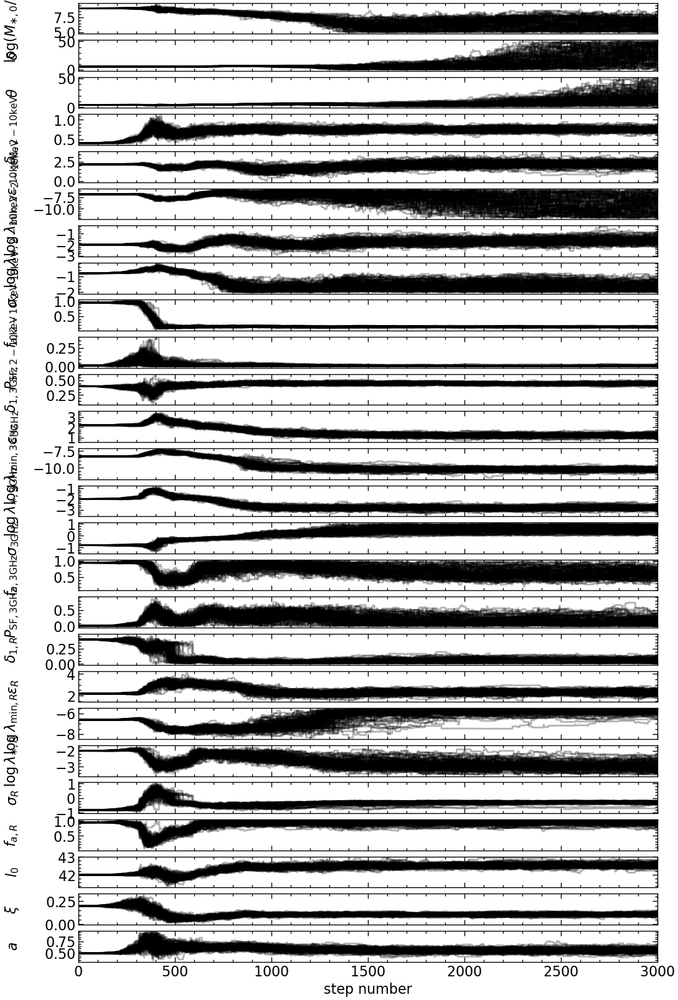

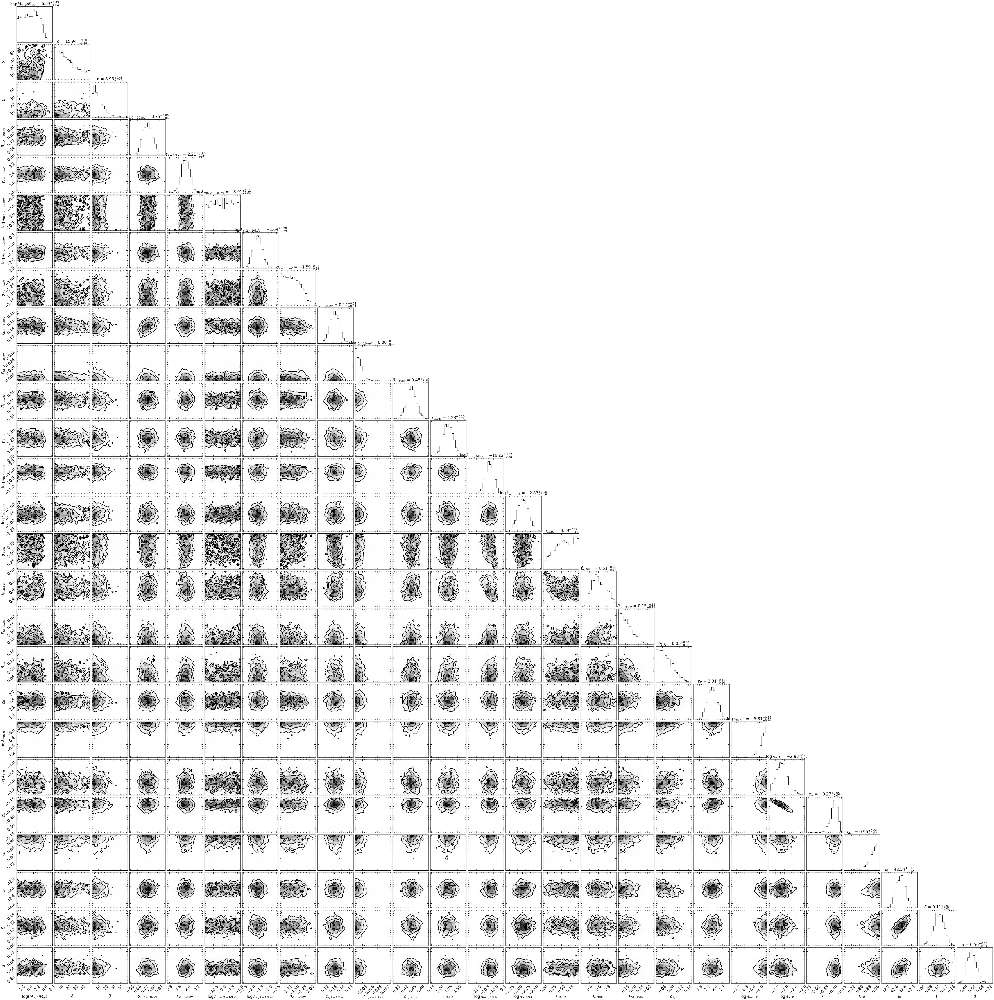

In [13]:
# Plot
fig, axes = plt.subplots(ndim, figsize=(12, 20), sharex=True)
samples = sampler.get_chain()

flat_samples = sampler.get_chain(discard=2000, thin=5, flat=True)
print(flat_samples.shape)

# logms0, alpha, beta, log_f, f_a, l0, xi, a, s 

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

#tau = sampler.get_autocorr_time()
#print(tau)

# Corner

fig_corner = corner.corner(flat_samples, labels=labels, color='k', plot_datapoints=False, show_titles=True)
fig_corner.savefig('cornermultiwavelength.pdf', dpi=300)


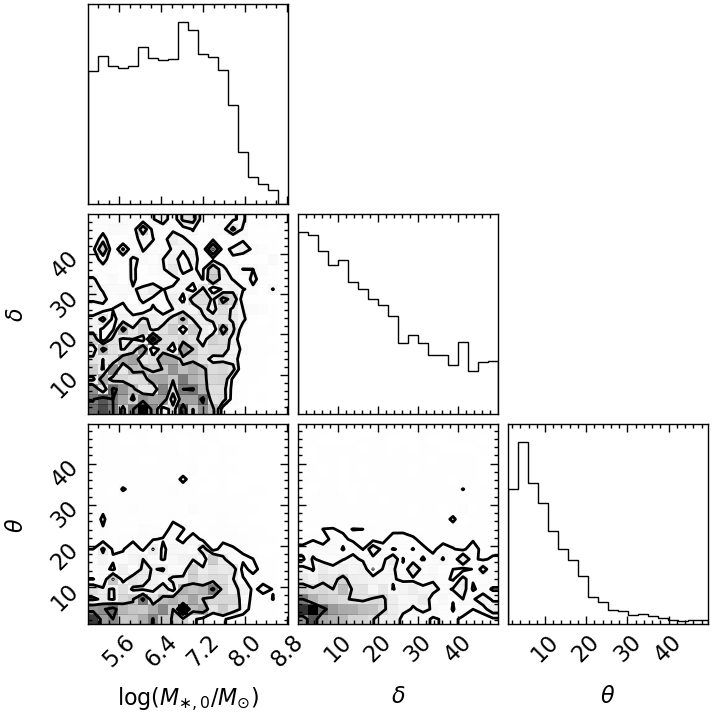

In [14]:
fig_corner_small = corner.corner(flat_samples[:,:3], labels=labels[:3], color='k', plot_datapoints=False) #, show_titles=True)

### Occupation Fraction Comparison

5.246036099290404
(19200, 26)


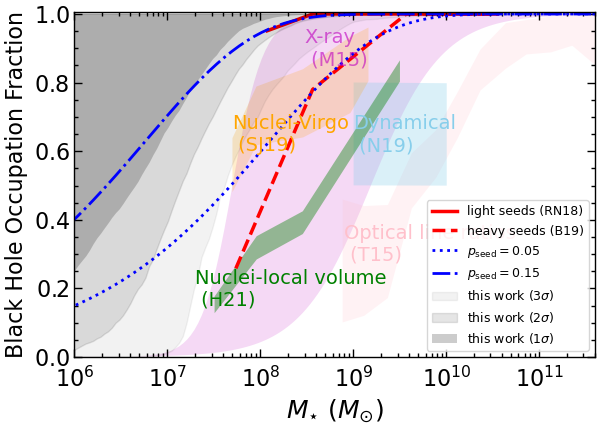

In [15]:
# From Hadair 2022
dat_trump = ascii.read('trump15.txt')
dat_nyguen = ascii.read('nguyen18.txt')
dat_sanchezjansser = ascii.read('sanchez-jansser19.txt')
dat_hoyer = ascii.read('hoyer21.txt')

# Freem Greene 2020
dat_greene = ascii.read('models.txt')

fig, ax = plt.subplots(1, 1, figsize=(6.2, 4.5))
ax.set_xscale('log')

# Plot the z=0 LISA band
ax.fill_between(10**dat_trump['col1'][:12], dat_trump['col2'][:12], dat_trump['col2'][12:], color='pink', alpha=0.2, lw=0)
ax.fill_between(10**dat_nyguen['col1'][:2], dat_nyguen['col2'][:2], dat_nyguen['col2'][2:], color='skyblue', alpha=0.3, lw=0)
ax.fill_between(10**dat_sanchezjansser['col1'][:5], dat_sanchezjansser['col2'][:5], dat_sanchezjansser['col2'][5:], color='orange', alpha=0.2, lw=0)
ax.fill_between(10**dat_hoyer['col1'][:4], dat_hoyer['col2'][:4], dat_hoyer['col2'][4:][::-1], color='green', alpha=0.4, lw=0)

# Labels
#ax.text(6e6, 0.8, 'this work', fontsize=17, color='black', alpha=0.6)
ax.text(5e7, 0.6, 'Nuclei-Virgo\n (SJ19)', fontsize=14, color='orange')
ax.text(1e9, 0.6, 'Dynamical\n (N19)', fontsize=14, color='skyblue')
ax.text(8e8, 0.28, 'Optical line ratios\n (T15)', fontsize=14, color='pink')
ax.text(2e7, 0.15, 'Nuclei-local volume\n (H21)', fontsize=14, color='green')
ax.text(3e8, 0.85, 'X-ray\n (M15)', fontsize=14, color='m', alpha=0.6)


ax.plot(10**dat_greene['col1'][:3], dat_greene['col2'][:3], color='r', zorder=1, lw=2.5, label='light seeds (RN18)')
ax.plot(10**dat_greene['col1'][3:7], dat_greene['col2'][3:7], color='r', zorder=1, lw=2.5, linestyle='dashed', label='heavy seeds (B19)')
#ax.plot(10**dat_greene['col1'][7:], dat_greene['col2'][7:], color='k', zorder=1)

x_eval = np.linspace(5, 13, 200)

alpha_h  = 0.1 # 10% of BHs sink
# Buchner analytic model 
p_seed = 0.05

Ms = 10**x_eval # stellar mass of 10^8.5
A = 0.0465
M_A = 10**11.77
beta = 1.00
Mh = 2**(-1/(beta + 1)) * (M_A**beta * Ms / A)**(1/(beta + 1)) # halo mass
Mc = 1e7 # 
N = alpha_h * 1/2 * (Mh/Mc)**(3/4)
focc = 1 - (1 - p_seed)**N

ax.plot(10**x_eval, focc, label=r'$p_{\rm{seed}}=0.05$', lw=2, color='b', linestyle='dotted')

### HEAVY SEED
# Buchner analytic model 
p_seed = 0.15

Ms = 10**x_eval # stellar mass of 10^8.5
A = 0.0465
M_A = 10**11.77
beta = 1.00
Mh = 2**(-1/(beta + 1)) * (M_A**beta * Ms / A)**(1/(beta + 1)) # halo mass
Mc = 1e7 #
N = alpha_h * 1/2 * (Mh/Mc)**(3/4)
focc = 1 - (1 - p_seed)**N

ax.plot(10**x_eval, focc, label=r'$p_{\rm{seed}}=0.15$', lw=2, color='b', linestyle='-.')


x_eval = np.linspace(5, 13, 200)

#flat_samples = flat_samples[:-2000,:]

# Occupation fraction
foccs = np.zeros([len(flat_samples), len(x_eval)])
for i, s in enumerate(flat_samples):
    xii = s[1]
    theta2i = s[2]
    foccs[i,:] =  1/(1 + xii * np.exp(-theta2i*(x_eval - s[0])))**(1/xii)

    #foccs[i,:] =  f_bhof_B19(x_eval, s[0], f_a=1, p_seed=xii, logMc=theta2i)

print(s[0])
print(np.shape(flat_samples))

ax.fill_between(10**x_eval, 0.5 + 0.5*np.tanh(2.5**np.abs(8.9 - 7.70)*np.log10(10**x_eval/10**7.70)),
                0.5 + 0.5*np.tanh(2.5**np.abs(8.9 - 9.19)*np.log10(10**x_eval/10**9.19)), color='m', lw=0, alpha=0.15, zorder=-10)

ax.fill_between(10**x_eval, np.percentile(foccs, 100-99.7, axis=0), np.percentile(foccs, 99, axis=0),
                color='k', lw=1, alpha=0.05, label=r'this work (3$\sigma$)')
ax.fill_between(10**x_eval, np.percentile(foccs, 5, axis=0), np.percentile(foccs, 99, axis=0),
                color='k', lw=1, alpha=0.1, label=r'this work (2$\sigma$)')
ax.fill_between(10**x_eval, np.percentile(foccs, 16, axis=0), np.percentile(foccs, 99, axis=0),
                color='k', lw=0, alpha=0.2, label=r'this work (1$\sigma$)')

ax.legend(fontsize=9, frameon=True, loc=4)

ax.set_ylim(0, 1.005)
ax.set_xlim(1e6, 4e11)

ax.set_xlabel(r'$M_{\star}\ (M_{\odot})$', fontsize=18)
ax.set_ylabel(r'Black Hole Occupation Fraction', fontsize=16)

ax.tick_params(axis='x', which='major', pad=7)

fig.tight_layout()
fig.savefig('occupationcombined.pdf', dpi=300)

In [16]:
100-84

16

(0.01, 1)

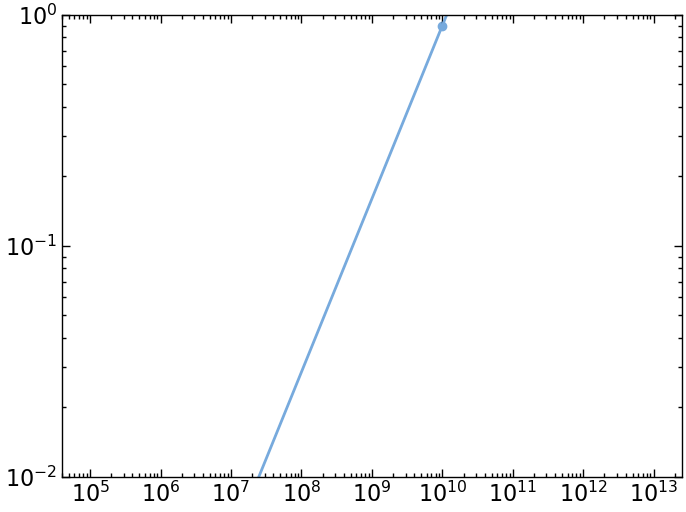

In [17]:
plt.loglog(Ms, (Ms/1e10)**(3/4) *0.9 )
plt.scatter(1e10, 0.9)
plt.ylim(1e-2, 1)

In [18]:
print(np.interp(8, x_eval, np.percentile(foccs, 5, axis=0)))

print(np.interp(7, x_eval, np.percentile(foccs, 5, axis=0)))

0.9116661759651642
0.38803655584914815


In [19]:
def logGSMF_blue(M_star):
    """
    Galaxy stellar mass function of the z ~ 0 blue+green galaxy population (single Schechter function)
    https://ui.adsabs.harvard.edu/abs/2012MNRAS.421..621B/abstract
    """
    M_br = 10**10.72
    phi = 0.71*1e-3
    alpha = -1.45
    phi = np.log(10) * np.exp(-M_star/M_br) * phi*(M_star/M_br)**(alpha+1)
    return phi

def logGSMF_red(M_star):
    """
    Galaxy stellar mass function of the z ~ 0 red galaxy population (double Schechter function)
    https://ui.adsabs.harvard.edu/abs/2012MNRAS.421..621B/abstract
    """
    M_br = 10**10.72
    phi1 = 3.25*1e-3
    phi2 = 0.08*1e-3
    alpha1 = -0.45
    alpha2 = -1.45
    phi = np.log(10) * np.exp(-M_star/M_br) * (phi1*(M_star/M_br)**(alpha1+1) + phi2*(M_star/M_br)**(alpha2+1))
    return phi

In [20]:
def logGSMF(M_star, size=1):
    """
    Galaxy stellar mass function of the z ~ 0 blue+green galaxy population (single Schechter function)
    https://ui.adsabs.harvard.edu/abs/2012MNRAS.421..621B/abstract
    """
    logM_br = 10.78
    dlogM_br = 0.01
    
    phi1 = 2.96*1e-3
    dphi1 = 0.40*1e-3
    
    phi2 = 0.63*1e-3
    dphi2 = 0.10*1e-3
    
    alpha1 = -0.62
    dalpha1 = 0.03
    
    alpha2 = -1.50
    dalpha2 = 0.01
    
    M_br = 10**np.random.normal(loc=logM_br, scale=dlogM_br, size=size)
    phi1 = np.random.normal(loc=phi1, scale=dphi1, size=size)
    
    phi2 = np.random.normal(loc=phi2, scale=dphi2, size=size)
    
    alpha1 = np.random.normal(loc=alpha1, scale=dalpha1, size=size)
    alpha2 = np.random.normal(loc=alpha2, scale=dalpha2, size=size)

    # dN/dlogM
    phi = np.log(10) * np.exp(-M_star/M_br) * (phi1*(M_star/M_br)**(alpha1+1) + phi2*(M_star/M_br)**(alpha2+1))
    
    return phi

In [21]:
len(flat_samples)

19200

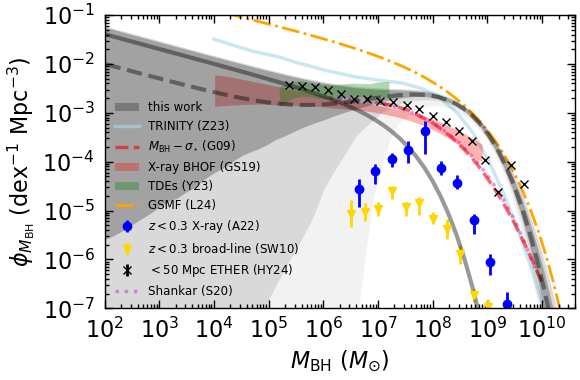

In [37]:
fig2, ax2 = plt.subplots(1, 1, figsize=(6, 4.0))
ax2.set_xscale('log')
ax2.set_yscale('log')

# grid
dlogm = .1
logms = np.arange(2.0, 14.5, dlogm)
ms = 10**logms
dms = np.diff(ms)

Nsamp = 8000 #len(flat_samples) #2000 

gsmf = np.zeros([len(logms), Nsamp])
gsmf_blue = np.zeros([len(logms), Nsamp])
gsmf_red = np.zeros([len(logms), Nsamp])

# BHOF should not depend on galaxy color type
bhmf16 = np.zeros([len(logms), Nsamp])
bhmf84 = np.zeros([len(logms), Nsamp])

bhmf_blue = np.zeros([len(logms), Nsamp])
bhmf_red = np.zeros([len(logms), Nsamp])
foccs = np.zeros([len(logms), Nsamp])


for i in range(Nsamp):

    # total BH mass function is dominated by early population
    # GSH20, early-type / E, limits
    alpha_red = np.random.normal(7.89, 0.09, size=1)
    beta_red = np.random.normal(1.33, 0.12, size=1)
    sigma_red = np.random.normal(0.2, 0.02, size=1)
    logms0_red = np.log10(3*1e10)

    # grid
    logmb_red = alpha_red + beta_red*(logms - logms0_red)
    mb_red = 10**logmb_red
    dmb_red = np.diff(mb_red)

    # BH mass - stellar mass relation
    # RV15 / similar to GSH20, early-type
    #alpha_blue = np.random.normal(7.45, 0.08, size=1)
    #beta_blue = np.random.normal(1.05, 0.11, size=1)
    #sigma_blue = np.random.normal(0.55-0.3, 0.02, size=1) # Assume 10% error on scatter - 0.3
    #logms0_blue = 11

    alpha_blue = np.random.normal(6.70, 0.13, size=1)
    beta_blue = np.random.normal(1.61, 0.12, size=1)
    sigma_blue = np.random.normal(0.2, 0.02, size=1) # Assume 10% error on scatter - 0.3
    logms0_blue = np.log10(3*1e10)

    # grid
    logmb_blue = alpha_blue + beta_blue*(logms - logms0_blue)
    mb_blue = 10**logmb_blue
    dmb_blue = np.diff(mb_blue)

    gsmf[:,i] = logGSMF(ms)
    gsmf_blue[:,i] = logGSMF_blue(ms)
    gsmf_red[:,i] = logGSMF_red(ms)

    # Convolve
    xii = flat_samples[i,1]
    theta2i = flat_samples[i,2]
    x50i = flat_samples[i,0]
    foccs[:,i] = 1/(1 + xii * np.exp(-theta2i*(logms - x50i)))**(1/xii)

    bhmf_blue[:,i] = 1 * np.array([np.trapz(gsmf_blue[:,i] * st.norm.pdf(logmbi-logms, loc=logmb_blue-logms, scale=sigma_blue)*dlogm) for logmbi in logmb_blue])
    bhmf_red[:,i] = 1 * np.array([np.trapz(gsmf_red[:,i] * st.norm.pdf(logmbi-logms, loc=logmb_red-logms, scale=sigma_red)*dlogm) for logmbi in logmb_red])


###

bhmf16 = np.interp(mb_red, mb_blue, np.interp(logmb_blue, logms, np.percentile(foccs, 16, axis=1)) * np.percentile(bhmf_blue, 16, axis=1)) + np.interp(mb_red, mb_red, np.interp(logmb_red, logms, np.percentile(foccs, 16, axis=1)) * np.percentile(bhmf_red, 16, axis=1))
bhmf84 = np.interp(mb_red, mb_blue, 1 * np.percentile(bhmf_blue, 84, axis=1)) + np.interp(mb_red, mb_red, 1 * np.percentile(bhmf_red, 84, axis=1))

bhmf5 = np.interp(mb_red, mb_blue, np.interp(logmb_blue, logms, np.percentile(foccs, 5, axis=1)) * np.percentile(bhmf_blue, 5, axis=1)) + np.interp(mb_red, mb_red, np.interp(logmb_red, logms, np.percentile(foccs, 5, axis=1)) * np.percentile(bhmf_red, 5, axis=1))
bhmf95 = np.interp(mb_red, mb_blue, 1 * np.percentile(bhmf_blue, 95, axis=1)) + np.interp(mb_red, mb_red, 1 * np.percentile(bhmf_red, 95, axis=1))

bhmf3 = np.interp(mb_red, mb_blue, np.interp(logmb_blue, logms, np.percentile(foccs, 100-99.7, axis=1)) * np.percentile(bhmf_blue, 100-99.7, axis=1)) + np.interp(mb_red, mb_red, np.interp(logmb_red, logms, np.percentile(foccs, 100-99.7, axis=1)) * np.percentile(bhmf_red, 100-99.7, axis=1))



ax2.fill_between(mb_red, bhmf84, bhmf16, color=color, alpha=0.25, lw=0, label=r'this work')
ax2.fill_between(mb_red, bhmf95, bhmf5, color='k', alpha=0.15, lw=0) #, label=r'this work (2$\sigma$)')
ax2.fill_between(mb_red, bhmf3, bhmf5, color='k', alpha=0.05, lw=0) #, label=r'this work (3$\sigma$)')

# Active fraction too
#ax2.fill_between(mb[:-1], np.percentile(bhmf[:-1], 16, axis=1) * dlogm,
#                 np.percentile(bhmf[:-1], 84, axis=1) * dlogm)

#x_eval_tde = np.logspace(5.1, 8.2, 10)
#ax2.plot(x_eval_tde, 5e-4*(x_eval_tde/1e7)**-0.25, linestyle='-.', color='green', label='TDEs (Y23)', alpha=0.8)

ax2.set_ylim(1e-7, 1e-1)
ax2.set_xlim(1e2, 4e10)
ax2.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$')
ax2.set_ylabel(r'$\phi_{M_{\rm{BH}}}$ (dex$^{-1}$ Mpc$^{-3})$')

dat = ascii.read('annana_bhmf_dat.txt')
dat_hi = ascii.read('annana_bhmf_up.txt')
dat_lo = ascii.read('annana_bhmf_lo.txt')
errs = np.abs([dat_hi['col2'] - dat['col2'], dat['col2'] - dat_lo['col2']])*10**dat['col2']/0.434

ax2.errorbar(10**dat['col1'], 10**dat['col2'], yerr=errs,
        color='blue', linestyle='none', marker='o', label='$z<0.3$ X-ray (A22)')

dat = ascii.read('schulze.dat')[::-1]
dat_hi = ascii.read('schulze_hi.dat')
dat_lo = ascii.read('schulze_lo.dat')
errs = np.abs([dat_hi['col2'] - dat['col2'], dat['col2'] - dat_lo['col2']])*10**dat['col2']/0.434

ax2.errorbar(10**dat['col1'], 10**dat['col2'], yerr=errs,
        color='gold', linestyle='none', marker='v', label=r'$z<0.3$ broad-line (SW10)')

dat = ascii.read('gh07.txt')
dat_hi = ascii.read('gh07_hi.txt')
dat_lo = ascii.read('gh07_lo.txt')
errs = np.abs([dat_hi['col2'] - dat['col2'], dat['col2'] - dat_lo['col2']])*10**dat['col2']/0.434

dat = ascii.read('ether.txt')
ax2.errorbar(10**dat['col1'], dat['col2'], yerr=0,
        color='k', linestyle='none', marker='x', label=r'$<50$ Mpc ETHER (HY24)')

#ax2.errorbar(10**dat['col1'], 10**dat['col2'], yerr=errs,
#        color='forestgreen', linestyle='none', marker='s', label='Green \& Ho 2007 ($z < 0.352$)')

#dat = ascii.read('shankar.txt')
#ax2.errorbar(10**dat['col1'], 10**dat['col2'], linestyle='dotted', color='m', label='Shankar (S13)', lw=2.5, zorder=-1, alpha=0.4)

dat = ascii.read('shankar2020.txt')
ax2.errorbar(10**dat['col1'], 10**dat['col2'], linestyle='dotted', color='m', label='Shankar (S20)', lw=2.5, zorder=-1, alpha=0.4)

dat = ascii.read('trinity.txt')
ax2.plot(dat['col1'], -dat['col2'], linestyle='solid',
             color='lightblue', label='TRINITY (Z23)', lw=2.5, zorder=-1, alpha=0.6)


dat = ascii.read('gultiken2.txt')
ax2.plot(10**dat['col1'], 10**dat['col2'], linestyle='dashed',
             color='red', label=r'$M_{\rm{BH}}-\sigma_{\star}$ (G09)', lw=2.5, zorder=-1, alpha=0.6)

dat_hi = ascii.read('gallo_hi.txt')
dat = ascii.read('gallo_lo.txt')
ax2.fill_between(dat_hi['col1'], dat_hi['col2'], np.interp(dat_hi['col1'], dat['col1'], dat['col2']),
                 color='r', lw=0, zorder=-1, alpha=0.3, label='X-ray BHOF (GS19)')

from matplotlib.patches import Polygon
dat = ascii.read('yao.txt')
f = np.array([10**dat['col1'].data, dat['col2'].data])
p = Polygon(f.T, facecolor='green', alpha=0.3, label='TDEs (Y23)')
ax2.add_patch(p)

ax2.loglog(10**logmb_red, 1e-2 * (10**logmb_red/10**8.09)**(-1.27+1) * np.exp(-(10**logmb_red/10**8.09)**(0.45)),
color='orange', linestyle='dashdot', label='GSMF (L24)', zorder=-1)

color='k'
# already put dm above!!
ax2.plot(mb_blue[:-1], np.percentile(bhmf_blue[:-1], 50, axis=1), # * dlogm,
        color=color, lw=3, linestyle='solid', alpha=0.4) #, label='late-type (this work)')
ax2.plot(mb_red[:-1], np.percentile(bhmf_red[:-1], 50, axis=1), # * dlogm,
        color=color, lw=3, linestyle='dashed', alpha=0.4) #, label='early-type (this work)')


# Axis
locmaj = matplotlib.ticker.LogLocator(base=10,numticks=14) 
ax2.xaxis.set_major_locator(locmaj)
locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),numticks=14)
ax2.xaxis.set_minor_locator(locmin)
ax2.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax2.tick_params(axis='x', which='major', pad=7)

locmaj = matplotlib.ticker.LogLocator(base=10,numticks=14) 
ax2.yaxis.set_major_locator(locmaj)
locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),numticks=14)
ax2.yaxis.set_minor_locator(locmin)
ax2.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax2.tick_params(axis='y', which='major', pad=7)



ax2.legend(fontsize=8.5, loc='lower left', ncol=1) #, bbox_to_anchor=(1, 0.5))

# seperate legend for this work

fig2.tight_layout()
fig2.savefig('bhmfcombined.pdf', dpi=300)

In [23]:
n_BH = trapezoid(np.interp(10**np.arange(4, 9, dlogm), mb_red, bhmf95*dlogm), dx=dlogm)
print(np.log10(n_BH))

-2.6192501653388733


In [24]:
n_BH

0.002402978220979967

In [25]:
p_BH = trapezoid(np.interp(10**np.arange(4, 9, dlogm), mb_red, mb_red*bhmf95*dlogm), dx=dlogm)
print(np.log10(p_BH))

4.684249528497966


In [26]:
x = np.linspace(5.5, 11.5, 10) # log M50 
y = np.linspace(1.5, 49, 10) # delta

X, Y = np.meshgrid(x, y)

Z = np.zeros([len(x), len(y)])

for i, xi in enumerate(x):
    for j, yi in enumerate(y):
        thetaij = np.median(flat_samples, axis=0)
        thetaij[0] = xi
        thetaij[1] = yi
        Z[i,j] = lp_comb(thetaij)

In [27]:
# Log L: delta vs. log M50

x = np.linspace(5.1, 11.9, 20) # log M50 
y = np.linspace(1.5, 49, 20) # delta

X, Y = np.meshgrid(x, y)

Z = np.zeros([len(x), len(y)])

for i, xi in enumerate(x):
    for j, yi in enumerate(y):
        thetaij = np.median(flat_samples, axis=0)
        thetaij[0] = xi
        thetaij[1] = yi
        Z[i,j] = lp_comb(thetaij)

#transform zi to a 0-1 range
Z1 = Z - np.nanmax(Z[np.isfinite(Z)]) #/(np.nanmax(Z[np.isfinite(Z)]) - np.nanmin(Z[np.isfinite(Z)]))
Z1 = 10**Z1
Z1[Z1==0] = 1e-200

Z1 = Z1 / np.nansum(Z1)

####

for i, xi in enumerate(x):
    for j, yi in enumerate(y):
        thetaij = np.median(flat_samples, axis=0)
        thetaij[0] = xi
        thetaij[2] = yi
        Z[i,j] = lp_comb(thetaij)

#transform zi to a 0-1 range
Z2 = Z - np.nanmax(Z[np.isfinite(Z)]) #/(np.nanmax(Z[np.isfinite(Z)]) - np.nanmin(Z[np.isfinite(Z)]))
Z2 = 10**Z2
Z2[Z2==0] = 1e-200

Z2 = Z2 / np.nansum(Z2)

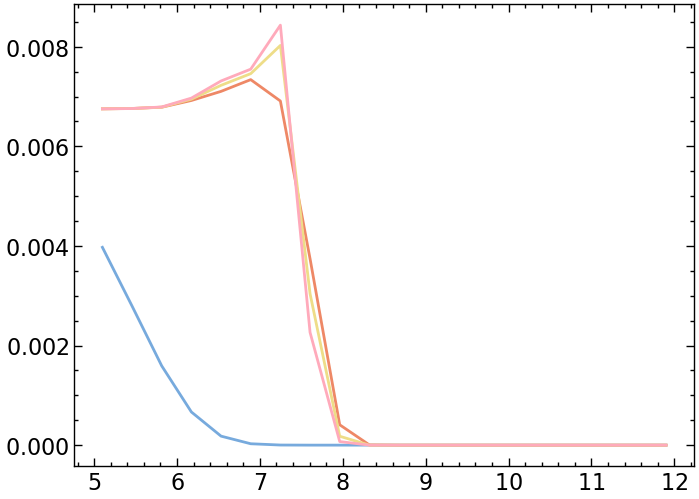

In [28]:
plt.plot(x, Z2[:,0])
plt.plot(x, Z2[:,5])
plt.plot(x, Z2[:,10])
plt.plot(x, Z2[:,15])

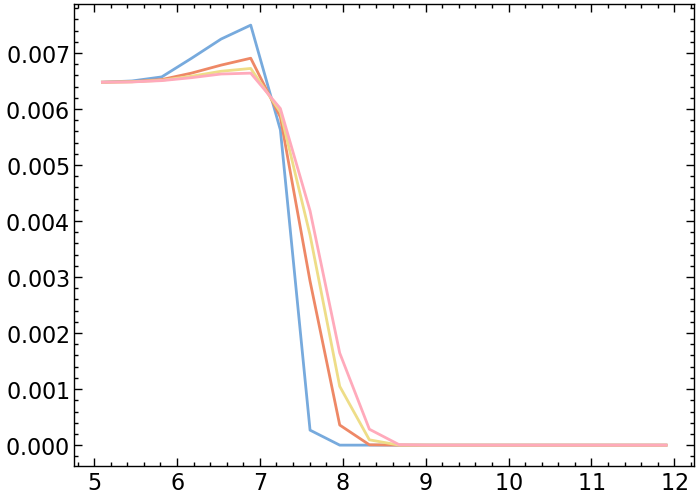

In [29]:
plt.plot(x, Z1[:,0])
plt.plot(x, Z1[:,5])
plt.plot(x, Z1[:,10])
plt.plot(x, Z1[:,15])

/tmp/tmp.IaqUrVdL6C/ipykernel_60987/3678542578.py:38: RuntimeWarning: invalid value encountered in log10
  im = axs[0].imshow(np.log10(Z1temp.T), origin='lower', extent=[5, 12, 0, 50], cmap='YlGnBu_r', alpha=1) #, norm=norm)
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/3678542578.py:55: RuntimeWarning: divide by zero encountered in log10
  Z2temp[np.log10(Z2temp)<-200] = -np.inf
/tmp/tmp.IaqUrVdL6C/ipykernel_60987/3678542578.py:56: RuntimeWarning: invalid value encountered in log10
  im = axs[1].imshow(np.log10(Z2temp.T), origin='lower', extent=[5, 12, 0, 50], cmap='YlGnBu_r', alpha=1) #, norm=norm)


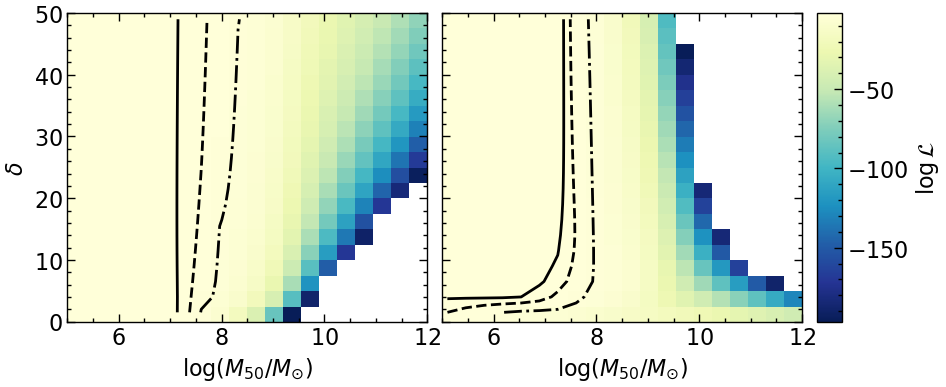

In [30]:
import matplotlib.colors as colors
from scipy import interpolate
from mpl_toolkits.axes_grid1 import ImageGrid


n = 1000
t = np.linspace(0, 1.0, n)
integral = ((Z1 >= t[:, None, None]) * Z1).sum(axis=(1,2))

f = interpolate.interp1d(integral, t)

#norm = colors.LogNorm(vmin=-3, vmax=-1)

#### 

X, Y = np.meshgrid(x, y)


#fig, axs = plt.subplots(1, 2, figsize=(16,6))

fig = plt.figure(figsize=(10, 4.5))
axs = ImageGrid(fig, 111,          # as in plt.subplot(111)
                 nrows_ncols=(1,2),
                 axes_pad=0.15,
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size="7%",
                 cbar_pad=0.15,
                 )

levels = f(np.array([0.997, 0.95, 0.68]))
#levels = 100 - np.array([0.997, 0.95, 0.68])
contours = axs[0].contour(X, Y, Z1.T, levels=levels, colors='black', linestyles=['dashdot','dashed','solid'])

Z1temp = Z1.copy()
Z1temp[np.log10(Z1temp)<-200] = -np.inf
im = axs[0].imshow(np.log10(Z1temp.T), origin='lower', extent=[5, 12, 0, 50], cmap='YlGnBu_r', alpha=1) #, norm=norm)
#fig.colorbar(im, label=r'$\log \mathcal{L}$');
axs[0].set_aspect(.12)

axs[0].set_xlabel(r'$\log( M_{50} / M_{\odot} )$')
axs[0].set_ylabel(r'$\delta$')

####

integral = ((Z2 >= t[:, None, None]) * Z2).sum(axis=(1,2))

f = interpolate.interp1d(integral, t)
levels = f(np.array([0.997, 0.95, 0.68]))

contours = axs[1].contour(X, Y, Z2.T, levels=levels, colors='black', linestyles=['dashdot','dashed','solid'])

Z2temp = Z2.copy()
Z2temp[np.log10(Z2temp)<-200] = -np.inf
im = axs[1].imshow(np.log10(Z2temp.T), origin='lower', extent=[5, 12, 0, 50], cmap='YlGnBu_r', alpha=1) #, norm=norm)
axs[1].cax.colorbar(im, label=r'$\log \mathcal{L}$');
axs[1].set_aspect(.12)

axs[1].set_xlabel(r'$\log( M_{50} / M_{\odot} )$')
axs[1].set_ylabel(r'$\theta$')

fig.savefig('logl2d.pdf', dpi=300)